<a href="https://colab.research.google.com/github/idanawagner/Laboratorio2-bigData/blob/Laboratorio2/LaboFinalizado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup

##Importaciones

In [ ]:
# Importa las bibliotecas necesarias
# Exploración y gráficos de datos
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.graph_objects as go
import pandas as pd

# Modelos de machine learning
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

# Hiperparameter-tunning, métricas y reportes
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.preprocessing import StandardScaler

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Lectura del Dataset y primeros datos

In [ ]:
 # Path de acceso al dataset
path = '/content/drive/MyDrive/Laboratorio 2/Canciones_Spotify.csv'

In [ ]:
# Creación de DataFrame en base al .csv
data = pd.read_csv('/content/drive/MyDrive/Laboratorio 2/Canciones_Spotify.csv')

Primeras aproximaciones:


*   Tamaño y forma del dataset
*   Metricas estadisticas descriptivas generales (desvío estandar, promedio, cuartiles, etc)
*   Tipos de datos, valores null


In [ ]:
data.shape # 2017 registros (filas) y 17 atributos (columnas)

(2017, 17)

In [ ]:
data.columns # Nombre de los atributos del dataset

Index(['Unnamed: 0', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'target',
       'song_title', 'artist'],
      dtype='object')

El método describe() nos aporta algunos valores elementales del dataset que podrán ser utlizados mas adelante para decidir hacia donde llevar el analisis exploratorio de los datos y el posterior entrenamiento de los modelos.

A simple vista, lo primero que observamos es que de los 17 atributos, hay 2 que no son de tipo numerico ya que no fueron tenidos en cuenta en los calculos.

In [ ]:
data.describe()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,1008.000000,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,582.402066,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000000,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,504.000000,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,1008.000000,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,1512.000000,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,2016.000000,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


In [ ]:
data.info() # Obtenemos el tipo de dato especifico de cad atributo y el recuento de valores null (en este caso, no hay)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        2017 non-null   int64  
 1   acousticness      2017 non-null   float64
 2   danceability      2017 non-null   float64
 3   duration_ms       2017 non-null   int64  
 4   energy            2017 non-null   float64
 5   instrumentalness  2017 non-null   float64
 6   key               2017 non-null   int64  
 7   liveness          2017 non-null   float64
 8   loudness          2017 non-null   float64
 9   mode              2017 non-null   int64  
 10  speechiness       2017 non-null   float64
 11  tempo             2017 non-null   float64
 12  time_signature    2017 non-null   float64
 13  valence           2017 non-null   float64
 14  target            2017 non-null   int64  
 15  song_title        2017 non-null   object 
 16  artist            2017 non-null   object 


A fin de poder comenzar a visualizar relaciones entre los distintos atributos, se separan en dos categorias: los categoricos (dtype = object) y los numericos (dtype = int64 o float64).
Se imprimen para corroborar rapidamente que se hayan clasificado correctamente.

In [ ]:
# Atributos categoricos
atrib_categoricos = data.select_dtypes(include=['object'])
print("Categorical columns: ", atrib_categoricos.columns.tolist())

# Atributos numericos
atrib_numericos = data.select_dtypes(include=['int64', 'float64'])
print("Numeric columns: ", atrib_numericos.columns.tolist())

Categorical columns:  ['song_title', 'artist']
Numeric columns:  ['Unnamed: 0', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence', 'target']


## Visualizaciones

### Visualizacion de un primer paiplot.
Sin filtros de ningun tipo para evaluar limpieza adicional de datos. La unica difenreciacion que se hace es en base al target para identificar si hay algun patron contundente.

*Recomendacion: Esta celda tarda hasta 2 minutos en ejecutarse. Si se quiere evitar esta demora, se recomineda no volver a ejecutarla.*

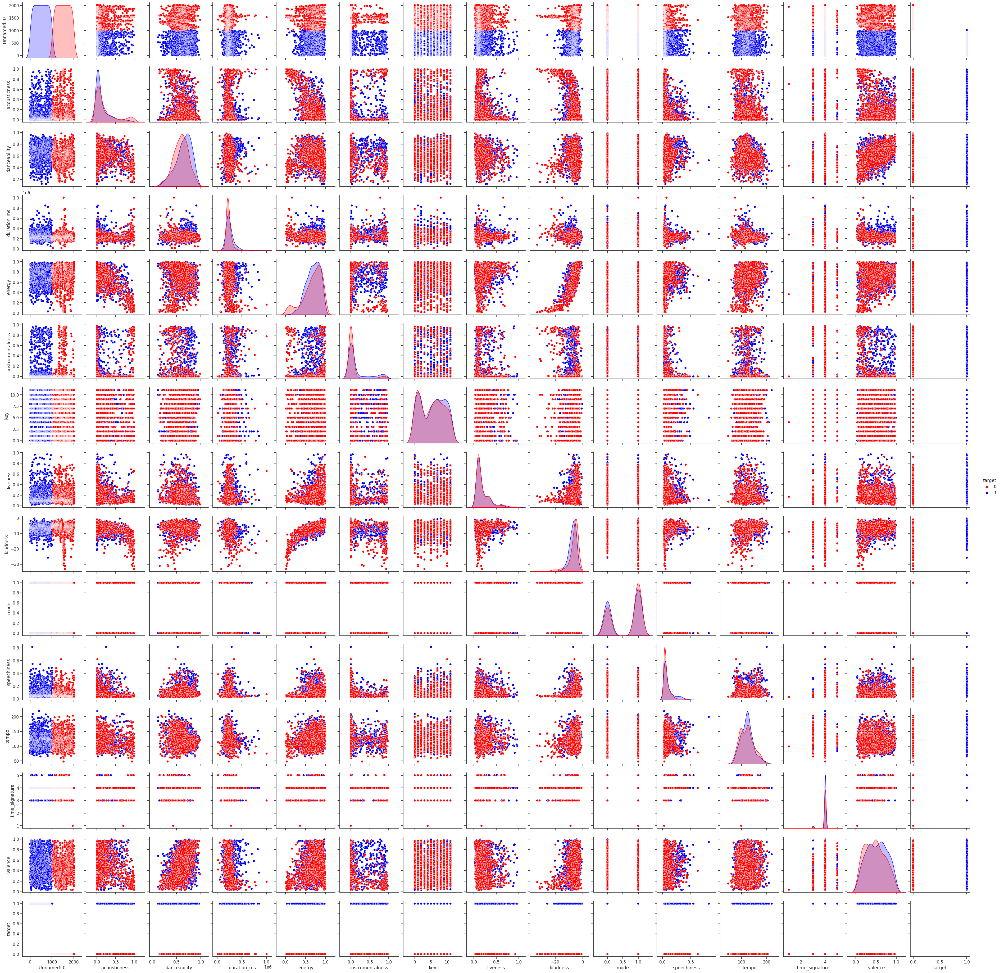

In [ ]:
# Crear el pairplot
sns.set(style="ticks")
sns.pairplot(atrib_numericos, vars=atrib_numericos.columns.tolist(), hue="target", palette={0: "red", 1: "blue"})

# Mostrar el gráfico
plt.show()

### Visualizacion de un segundo paiplot.
A fin de poder interpretar un poco mejor la información del dataset, se realiza un segundo grafico con un numero menor de atributos

*Recomendacion: Esta celda tarda hasta 1 minutos en ejecutarse. Si se quiere evitar esta demora, se recomineda no volver a ejecutarla.*

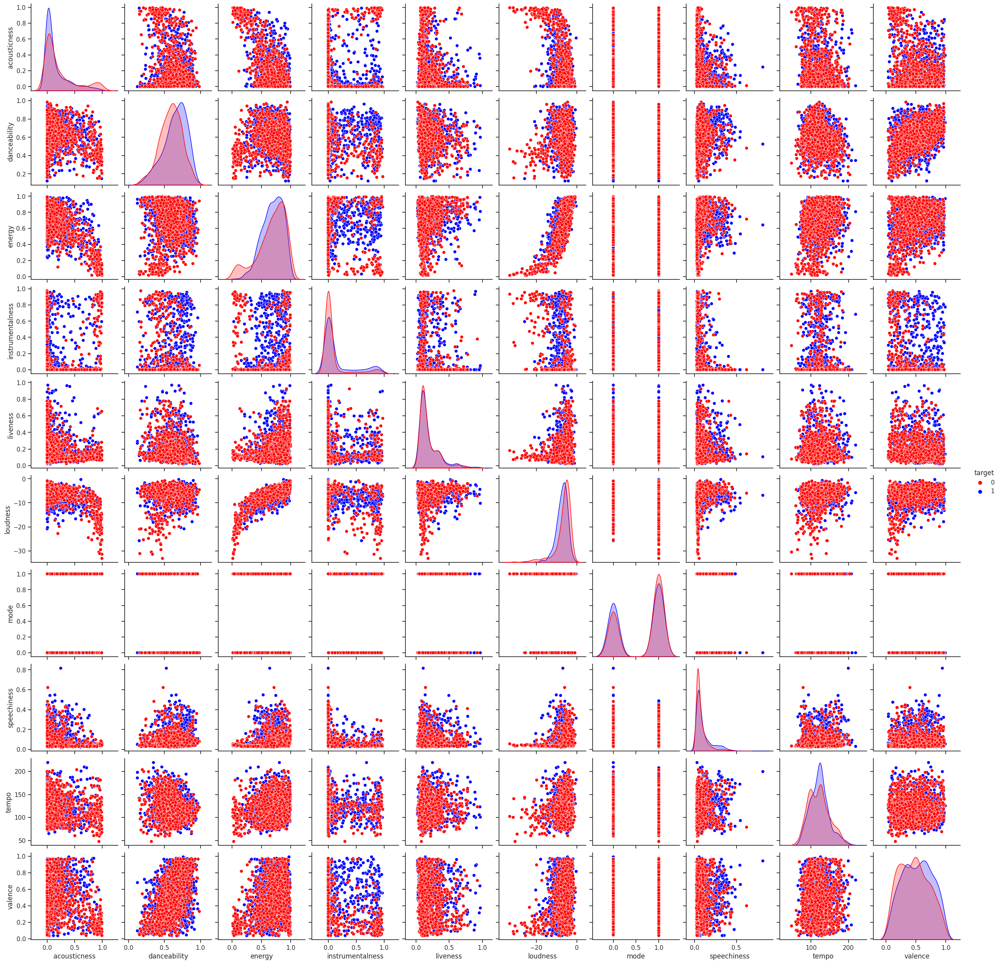

In [ ]:
atributos = ['acousticness',
             'danceability',
             'energy',
             'instrumentalness',
             'liveness',
             'loudness',
             'mode',
             'speechiness',
             'tempo',
             'valence']

# Crear el pairplot
sns.set(style="ticks")
sns.pairplot(atrib_numericos, vars=atributos, hue="target", palette={0: "red", 1: "blue"})

# Mostrar el gráfico
plt.show()

### Visualizacion de mapa de calor

Si bien, con los pairplot comienzan a observarse relaciones entre los distintos atributos, se utilizará un mapa de calor para poder determinar un valor numerico para esas relaciones.

*Nota: Se elimina del conjunto de datos numericos el atributo "Unnamed: 0" por entenderselo como un atributo que ha sido incluido por error en la recolecicon de datos y debe ser limpiado. Tambien se eliminan registros duplicados por la misma razon*

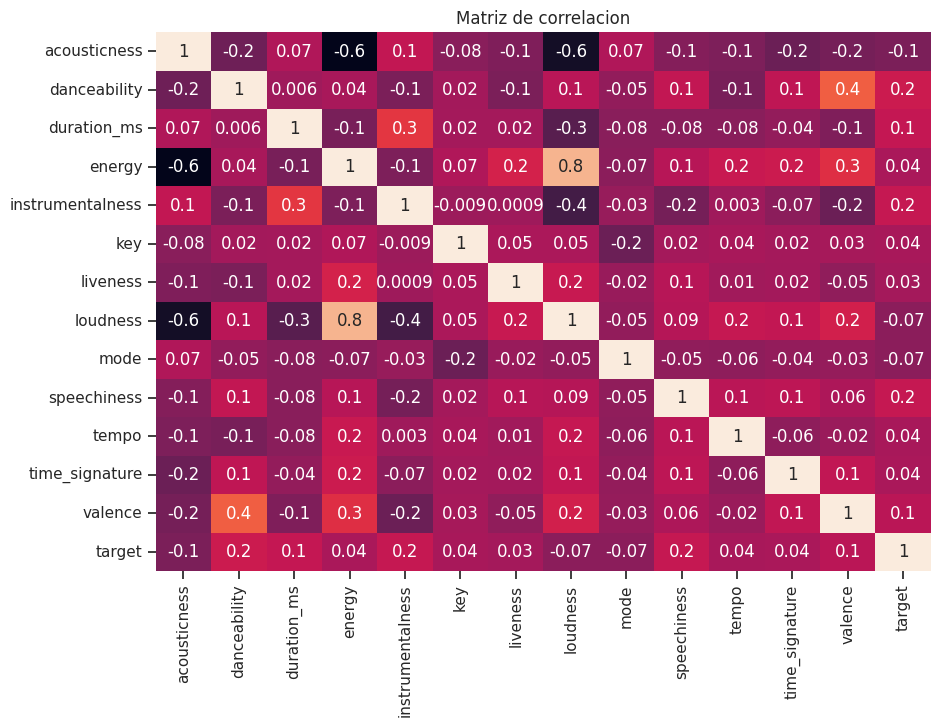

In [ ]:
# Elimnar atributo
atrib_numericos = atrib_numericos.drop("Unnamed: 0", axis="columns")

# Eliminar duplicados
atrib_numericos = atrib_numericos.drop_duplicates()


# Grafico de matriz de correlacion
fig, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(atrib_numericos.corr(), annot=True, fmt='.1g',  cbar=False)
plt.title('Matriz de correlacion')
plt.show()

En este mapa se puede oberservar que cada atributo presenta variadas relaciones con los otros. Sin embargo, hay algunas relaciones mas consolidadas que otras.
Así, por ejemplo, se observa que energy y loudness tiene una altisima correlacion (del 0.8) y, a su vez, loudness tiene una relacion considerable con intrumentalness (del 0.4) aunque con valor negativo lo que da a entender que a medida que aumenta uno, disminuye el otro. Al respecto de esto último, ocurre algo similar con loudness y acousticness aunque con un valor un poco mas alto (0.6) pero igualmente inverso.
Existen otras relaciones que merecen ser mencionadas como por ejemplo entre valence y danceability (0.4).

Por ultimo, mencionaremos que el atributo target tiene diversar relaciones con los demás atributos por lo que, en principio, sólo podemos concluir que las preferencias del usuario no estan determinadas exclusivamente por un solo atributo sino que involucran varios de ellos en simultaneo.

### Visualizaciones por atributo

A continuación se muestran graficos en donde se visualizan las preferencias del usuario con respecto a cada atributo y su distribucion.

In [ ]:
#Funcion que permite graficar de manera estadarizada la distribución en funcion de un atributo especifico

def visualizacion_gustos_por_atributo(data, atributo, target):
  pos_atributo = data[data[target] == 1][atributo]
  neg_atributo = data[data[target] == 0][atributo]

  fig =plt.figure(figsize=(8,6))
  plt.title(f'{atributo.upper()} - Gusta/No Gusta')

  pos_atributo.hist(alpha = 0.7, bins= 30, label = 'Me gusta')
  neg_atributo.hist(alpha = 0.7, bins= 30, label = 'No me gusta')
  plt.legend(loc = 'upper right')


In [ ]:
#Seleccion de atributos
atrib_visualizacion = ['acousticness',
                       'danceability',
                       'energy',
                       'instrumentalness',
                       'liveness',
                       'loudness',
                       'speechiness',
                       'tempo',
                       'valence']

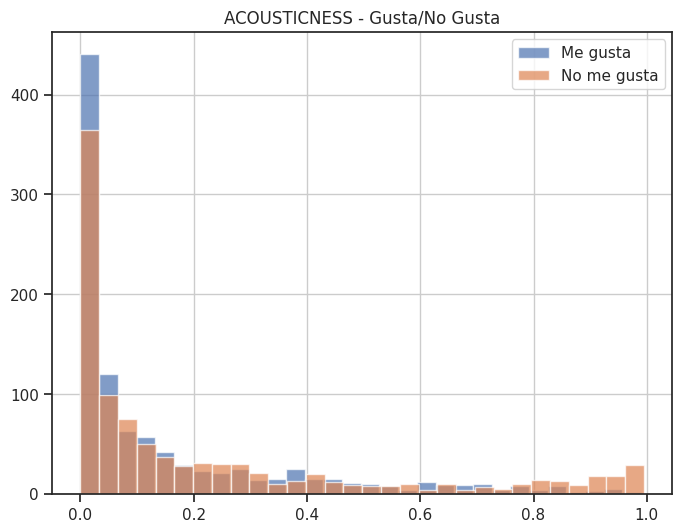

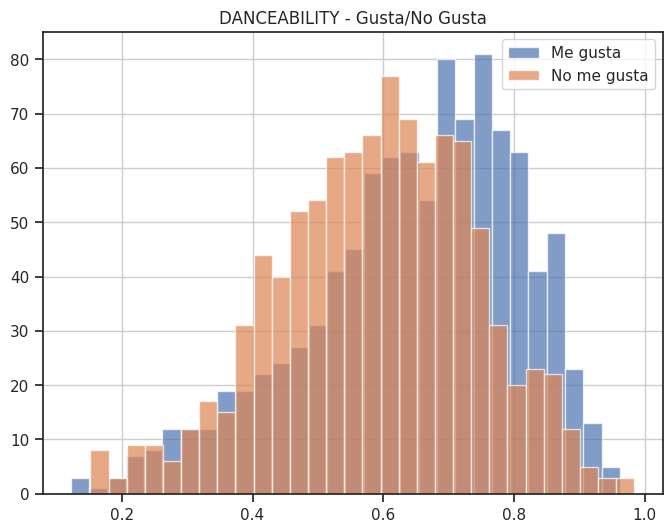

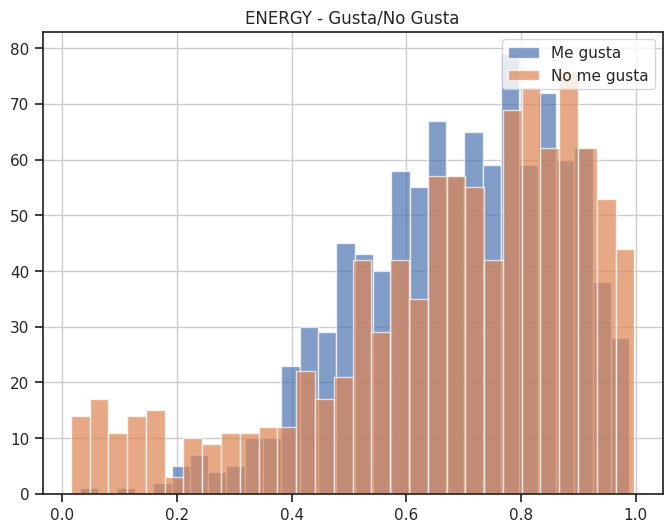

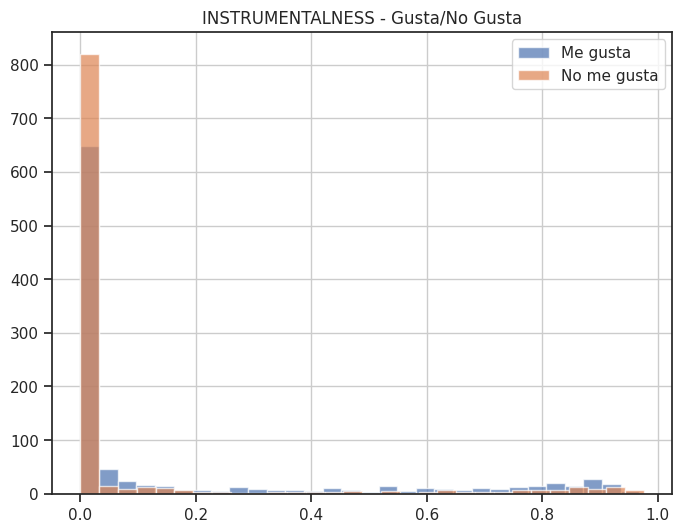

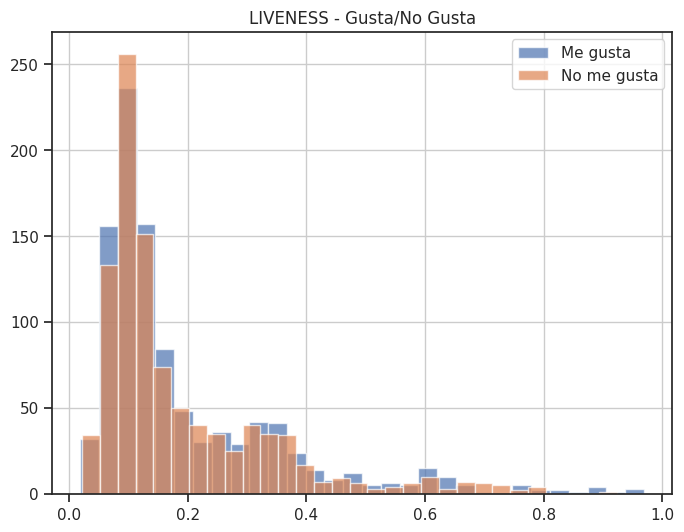

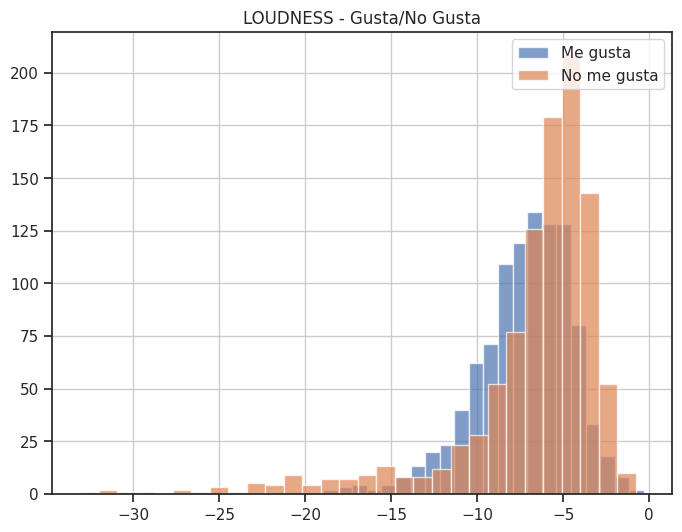

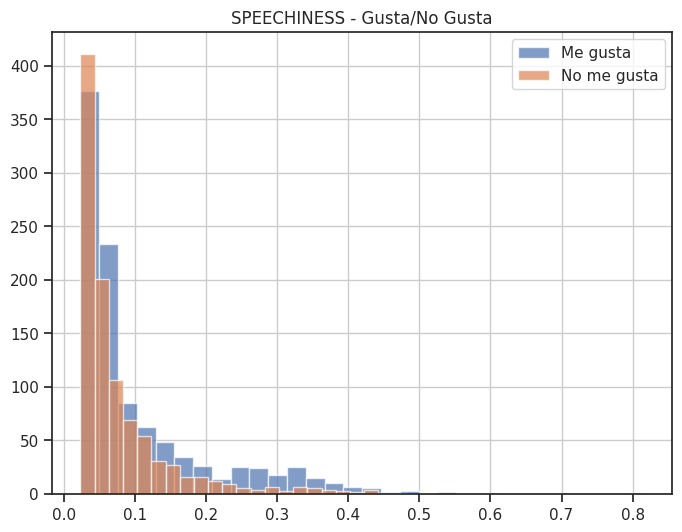

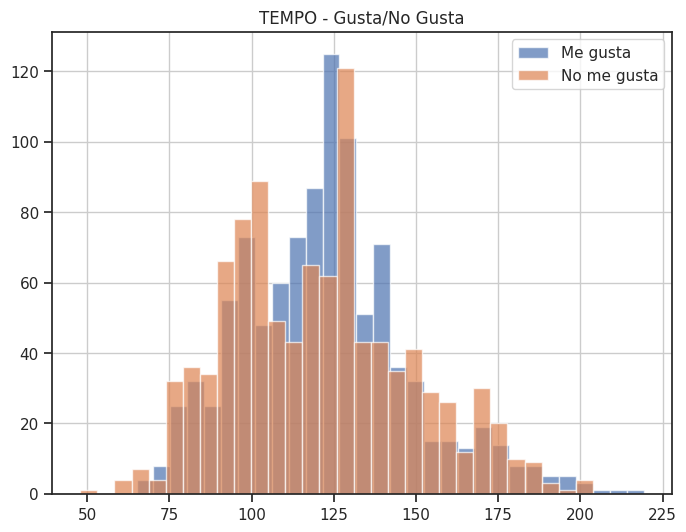

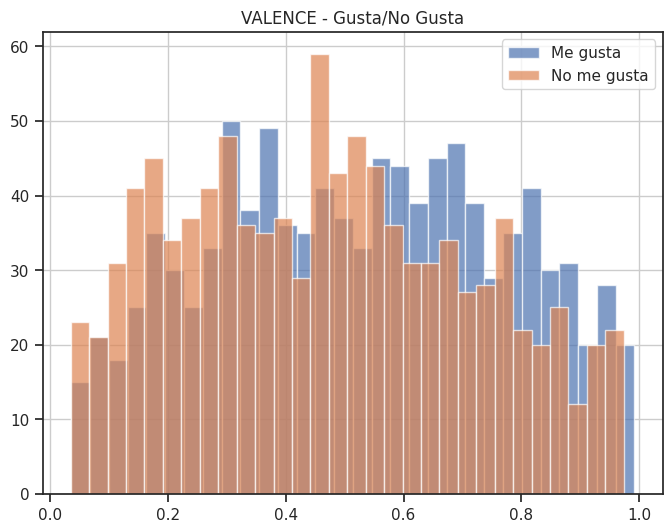

In [ ]:
#Ciclo for para ejecutar de una sola vez todas las visualizaciones
for atributo in atrib_visualizacion:
  visualizacion_gustos_por_atributo(atrib_numericos, atributo, 'target')

##Conclusiones EDA:
Si bien a lo largo del analisis exploratorio de estos datos no se han encontrado tendencias contundentes al respecto de un atributo especifico, si se puede concluir que hay algunas variaciones en cuanto a las preferencias del usuario en determinada características.
Esto, sumado a la matriz de correlaciones, permiten identificar que hay interrelaciones entre los atributos que podrían dar forma a un modelo de entranimento que permita identificar con cierto nivel de precision las futuras preferencias del usuario.

Dicho esto, y en funcion de lo analizado hasta ahora se procede a la limpieza del dataframe que se utilizará para el entrenamiento y testeo de los modelos de ML.

# Entrenamiento de modelos

In [ ]:
# Funciones:
def puntajes(modelo, X, y, crossvalidation):
    puntajes = cross_val_score(modelo, X, y.ravel(), cv=crossvalidation)
    print("Precisión promedio:", puntajes.mean())
    print("Desvio estándar:   ", puntajes.std())
    return

In [ ]:
# Paso 1: Carga y exploración de datos
data = pd.read_csv(path)
data.dropna()  # Elimina las filas con valores faltantes
data.drop(['song_title', 'Unnamed: 0'], axis=1)  # Elimina las columnas 'song_title' y 'artist'
data.drop_duplicates()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.01020,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.19900,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.03440,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.60400,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.18000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.3330,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.1310,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.1070,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.1330,150.011,4.0,0.623,0,First Contact,Twin Moons


In [ ]:
# Paso 2: Selección de características
# Elegimos las características relevantes que se utilizarán
features = data[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]

In [ ]:
# Paso 3: División de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features, data['target'], test_size=0.5, random_state=42)

Grid Search KNN

Mejores hiperparámetros encontrados:
{'n_neighbors': 5, 'weights': 'uniform'}
Precisión promedio: 0.5760923107236098
Desvio estándar:    0.04975456405738622
Reporte de Clasificación:

              precision    recall  f1-score   support

           0       0.60      0.67      0.64       490
           1       0.65      0.59      0.62       519

    accuracy                           0.63      1009
   macro avg       0.63      0.63      0.63      1009
weighted avg       0.63      0.63      0.63      1009


Matriz de Confusión del modelo KNeighborsClassifier:
[[328 162]
 [215 304]]



Text(53.75, 0.5, 'Datos Reales')

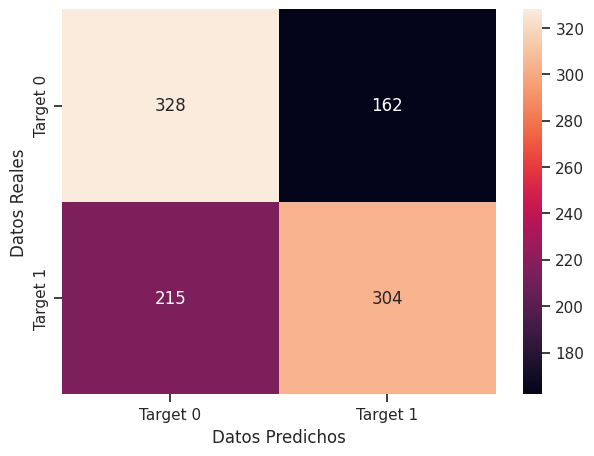

In [ ]:
# Ajuste de hiperparámetros (Grid Search) modelo KNN
param_grid = {
    'n_neighbors': [1,3, 5],  # Valores posibles para el hiperparámetro n_neighbors
    'weights': ['uniform', 'distance'],  # Valores posibles para el hiperparámetro weights
}

knn_model = KNeighborsClassifier()

# Realiza una búsqueda exhaustiva de hiperparámetros
grid_search = GridSearchCV(knn_model, param_grid, cv=10, scoring='f1')
grid_search.fit(X_train, y_train)

# Imprime los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Entrena el modelo con los mejores hiperparámetros
best_knn_model = grid_search.best_estimator_
best_knn_model.fit(X_train, y_train)

# Evalúa el modelo con los mejores hiperparámetros
y_pred = best_knn_model.predict(X_test)
scores = puntajes(best_knn_model, features, data['target'], 10)

#Reporte de clasificacion
print("Reporte de Clasificación:\n")
print(classification_report(y_test, y_pred))

#MAtriz de confusion
cm = confusion_matrix(y_test.ravel(), y_pred.ravel())
print(f'\nMatriz de Confusión del modelo {best_knn_model.__class__.__name__}:\n{cm}\n')
plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=['Target 0', 'Target 1'], yticklabels=['Target 0', 'Target 1'])
plt.xlabel("Datos Predichos")
plt.ylabel("Datos Reales")

Grid Search SVM

Mejores hiperparámetros encontrados:
{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Precisión promedio: 0.6261785133737254
Desvio estándar:    0.058429552617011646
Reporte de Clasificación:

              precision    recall  f1-score   support

           0       0.62      0.63      0.63       490
           1       0.65      0.64      0.64       519

    accuracy                           0.64      1009
   macro avg       0.64      0.64      0.64      1009
weighted avg       0.64      0.64      0.64      1009


Matriz de Confusión del modelo SVC:
[[311 179]
 [187 332]]



Text(53.75, 0.5, 'Datos Reales')

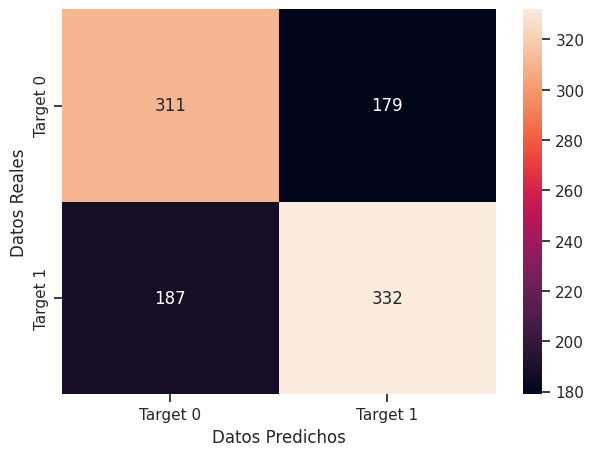

In [ ]:
# Definir el espacio de búsqueda de hiperparámetros para SVM
param_grid = {
    'C': [0.1, 1, 10],         # Valores posibles para el hiperparámetro C
    'kernel': ['linear', 'rbf'],  # Valores posibles para el hiperparámetro kernel
    'gamma': [0.001, 0.01, 0.1]  # Valores posibles para el hiperparámetro gamma
}

# Crear el clasificador SVM
svm_model = SVC()

# Realizar la búsqueda de cuadrícula
grid_search = GridSearchCV(svm_model, param_grid, cv=10, scoring='f1')
grid_search.fit(X_train, y_train)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Entrenar el modelo con los mejores hiperparámetros
best_svm_model = grid_search.best_estimator_
best_svm_model.fit(X_train, y_train)


# Evalúa el modelo con los mejores hiperparámetros
y_pred = best_svm_model.predict(X_test)
scores = puntajes(best_svm_model, features, data['target'], 10)


#Reporte de clasificacion
print("Reporte de Clasificación:\n")
print(classification_report(y_test, y_pred))

#MAtriz de confusion
cm = confusion_matrix(y_test.ravel(), y_pred.ravel())
print(f'\nMatriz de Confusión del modelo {best_svm_model.__class__.__name__}:\n{cm}\n')
plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=['Target 0', 'Target 1'], yticklabels=['Target 0', 'Target 1'])
plt.xlabel("Datos Predichos")
plt.ylabel("Datos Reales")


Grid Search DecitionTree

Mejores hiperparámetros encontrados:
{'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}
Precisión promedio: 0.6693512634845574
Desvio estándar:    0.09311097075747868
Reporte de Clasificación:

              precision    recall  f1-score   support

           0       0.69      0.78      0.73       490
           1       0.76      0.67      0.71       519

    accuracy                           0.72      1009
   macro avg       0.73      0.72      0.72      1009
weighted avg       0.73      0.72      0.72      1009


Matriz de Confusión del modelo DecisionTreeClassifier:
[[381 109]
 [170 349]]



Text(53.75, 0.5, 'Datos Reales')

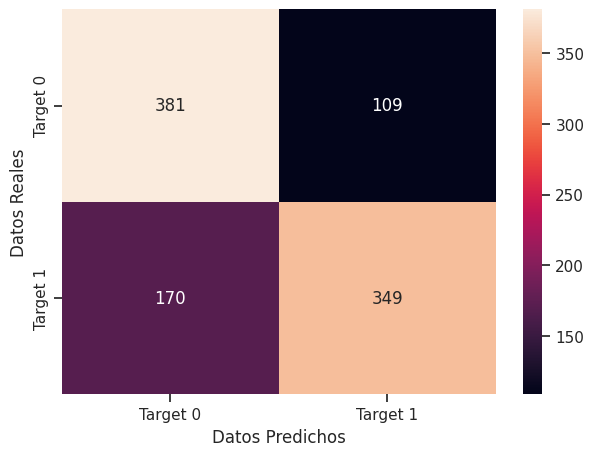

In [ ]:
# Definir el espacio de búsqueda de hiperparámetros para Decision Tree
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Valores posibles para la profundidad máxima
    'min_samples_split': [2, 5, 10],  # Valores posibles para min_samples_split
    'min_samples_leaf': [1, 2, 4]    # Valores posibles para min_samples_leaf
}

# Crear el clasificador Decision Tree
tree_model = DecisionTreeClassifier()

# Realizar la búsqueda de cuadrícula
grid_search = GridSearchCV(tree_model, param_grid, cv=10, scoring='f1')
grid_search.fit(X_train, y_train)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Entrenar el modelo con los mejores hiperparámetros
best_tree_model = grid_search.best_estimator_
best_tree_model.fit(X_train, y_train)

# Evalúa el modelo con los mejores hiperparámetros
y_pred = best_tree_model.predict(X_test)
scores = puntajes(best_tree_model, features, data['target'], 10)


#Reporte de clasificacion
print("Reporte de Clasificación:\n")
print(classification_report(y_test, y_pred))

#MAtriz de confusion
cm = confusion_matrix(y_test.ravel(), y_pred.ravel())
print(f'\nMatriz de Confusión del modelo {best_tree_model.__class__.__name__}:\n{cm}\n')
plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=['Target 0', 'Target 1'], yticklabels=['Target 0', 'Target 1'])
plt.xlabel("Datos Predichos")
plt.ylabel("Datos Reales")

Bayes

Mejores hiperparámetros encontrados:
{'var_smoothing': 1e-09}
Precisión promedio: 0.5572631890054677
Desvio estándar:    0.09304997245066682
Reporte de Clasificación:

              precision    recall  f1-score   support

           0       0.65      0.67      0.66       490
           1       0.68      0.65      0.67       519

    accuracy                           0.66      1009
   macro avg       0.66      0.66      0.66      1009
weighted avg       0.66      0.66      0.66      1009


Matriz de Confusión del modelo GaussianNB:
[[330 160]
 [180 339]]



Text(53.75, 0.5, 'Datos Reales')

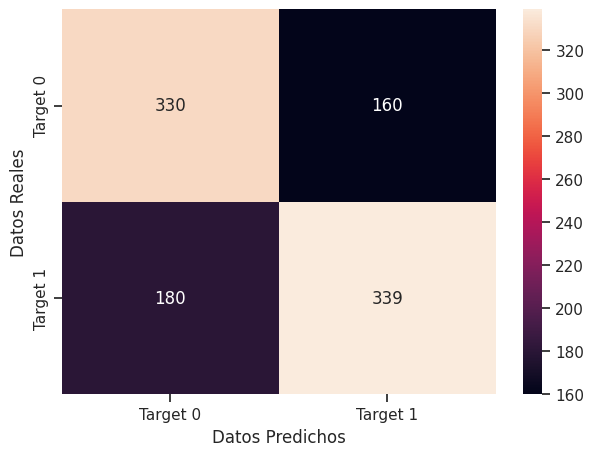

In [ ]:
# No hay muchos hiperparámetros para ajustar en un modelo Naive Bayes, pero aquí está un ejemplo
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7]  # Valores posibles para el suavizado de la varianza
}

# Crear el clasificador Naive Bayes (GaussianNB)
nb_model = GaussianNB()

# Realizar la búsqueda en cuadrícula (aunque no es común en modelos Naive Bayes)
grid_search = GridSearchCV(nb_model, param_grid, cv=10, scoring='f1')
grid_search.fit(X_train, y_train)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Entrenar el modelo con los mejores hiperparámetros (aunque no es común en modelos Naive Bayes)
best_nb_model = grid_search.best_estimator_
best_nb_model.fit(X_train, y_train)

# Evalúa el modelo con los mejores hiperparámetros
y_pred = best_nb_model.predict(X_test)
scores = puntajes(best_nb_model, features, data['target'], 10)


#Reporte de clasificacion
print("Reporte de Clasificación:\n")
print(classification_report(y_test, y_pred))

#Matriz de confusion
cm = confusion_matrix(y_test.ravel(), y_pred.ravel())
print(f'\nMatriz de Confusión del modelo {best_nb_model.__class__.__name__}:\n{cm}\n')
plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=['Target 0', 'Target 1'], yticklabels=['Target 0', 'Target 1'])
plt.xlabel("Datos Predichos")
plt.ylabel("Datos Reales")

In [ ]:
# Paso 8: Ensamble de modelos
ensemble_model = VotingClassifier(estimators=[('knn', best_knn_model), ('svm', best_svm_model), ('tree', best_tree_model), ('nb', best_nb_model)], voting='hard')
ensemble_model.fit(X_train, y_train)
ensemble_y_pred = ensemble_model.predict(X_test)

Ensamble de Modelos
              precision    recall  f1-score   support

           0       0.65      0.84      0.73       490
           1       0.79      0.58      0.67       519

    accuracy                           0.70      1009
   macro avg       0.72      0.71      0.70      1009
weighted avg       0.72      0.70      0.70      1009

Matriz de Confusión:
[[410  80]
 [220 299]]



Text(53.75, 0.5, 'Datos Reales')

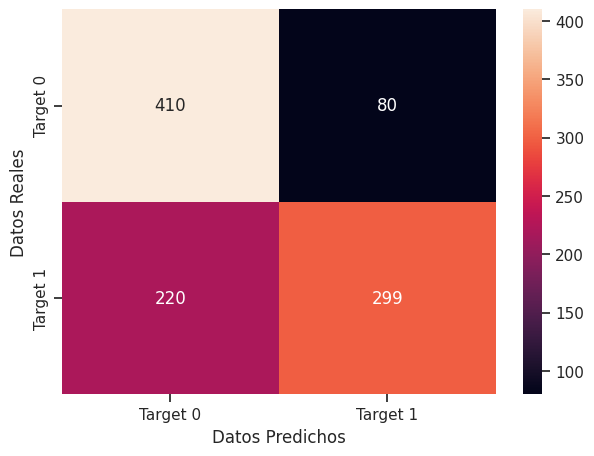

In [ ]:
# Paso 9: Evaluación y análisis del rendimiento del ensamble
cm = confusion_matrix(y_test, ensemble_y_pred)
print("Ensamble de Modelos")
print(classification_report(y_test, ensemble_y_pred))
print(f"Matriz de Confusión:\n{cm}\n")

plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=['Target 0', 'Target 1'], yticklabels=['Target 0', 'Target 1'])
plt.xlabel("Datos Predichos")
plt.ylabel("Datos Reales")

In [ ]:
# Paso 10: Documentación y Presentación
# Documentamos los hallazgos, decisiones y conclusiones